# Analysis of data at 48h

## Insert in barcode assignment table, the morphotype information

In [1]:
library(ggplot2)

Warning message:
“replacing previous import ‘lifecycle::last_warnings’ by ‘rlang::last_warnings’ when loading ‘tibble’”


In [2]:

barcode_assignment_48h <- readRDS("./files/demultiplexing/barcode_assignment_48h.rds")
head(barcode_assignment_48h)
dim(barcode_assignment_48h)



,cell,Bar1,Bar2,Bar3,Bar4,Bar5,Bar6,Bar7,Bar8,Bar9,⋯,Bar64,Bar65,Bar66,Bar67,Bar68,Bar69,Bar70,Bar71,Bar72,V1
,<chr>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,⋯,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<chr>
1,AAACCCAAGTTCTACG,7,1,6,4,6,9,2,6,16,⋯,1,6,2,5,11,2,3,10,2,Bar44
2,AAACCCACACAAGGTG,9,0,5,1,2,9,0,6,9,⋯,1,0,0,6,5371,1,1,4,5,Bar68
3,AAACCCACAGCTGGTC,9,4,7,0,2,14,2,6,13,⋯,0,5,5,9,10,2,1,4,2,Bar58
4,AAACCCAGTCGTTGCG,6,1,6,2,1,6,2,5,5,⋯,3,5,2,2,8,2,2,2,1,Doublet
5,AAACCCATCCTACACC,5,2,12,1,4,7,3,6,12,⋯,28,5,6,3,19,5,0,2,1,Doublet
6,AAACGAAAGCCGAATG,8,4,9,3,2,11,5,2,9,⋯,7,6,4,6,14,16,0,10,5,Doublet


[1] 7470   74

In [3]:
dim(barcode_assignment_48h)
# Remove negative and doublet cells
Negative<-which(grepl("Negative", barcode_assignment_48h$V1))
barcode_assignment_48h<-barcode_assignment_48h[-c(Negative),]
Doublet<-which(grepl("Doublet", barcode_assignment_48h$V1))
barcode_assignment_48h<-barcode_assignment_48h[-c(Doublet),]
dim(barcode_assignment_48h)

[1] 7470   74

[1] 5768   74

In [4]:
phenoTable_48h <- readRDS("./files/demultiplexing/PhenoTable_after_demultiplexing_48h.rds")
head(phenoTable_48h)
dim(phenoTable_48h)

,bar,Sample,Multi_BC,Multi_BC_#,Plate,Morphotype,Area,AR,barcodes,experiment,n_cells
,<chr>,<chr>,<chr>,<chr>,<dbl>,<chr>,<dbl>,<dbl>,<chr>,<chr>,<int>
1,Bar1,B11,CCTTGGCACCCGAGAATTCCACCACAATGAAAAAAAAAAAAAAAAAAAAAAAAAAAAAA,A2,2,round,58019.50,1.082,CCACAATG,48h,53
2,Bar10,B2,CCTTGGCACCCGAGAATTCCATGACCGATAAAAAAAAAAAAAAAAAAAAAAAAAAAAAA,B2,2,round,60326.06,1.096,TGACCGAT,48h,61
3,Bar11,B3,CCTTGGCACCCGAGAATTCCAGCAACGCCAAAAAAAAAAAAAAAAAAAAAAAAAAAAAA,B3,2,round,57845.56,1.043,GCAACGCC,48h,121
4,Bar12,B4,CCTTGGCACCCGAGAATTCCACAATCGGTAAAAAAAAAAAAAAAAAAAAAAAAAAAAAA,B4,2,round,58193.44,1.003,CAATCGGT,48h,75
5,Bar13,B5,CCTTGGCACCCGAGAATTCCAATAGCGTCAAAAAAAAAAAAAAAAAAAAAAAAAAAAAA,B5,2,round,54722.25,1.080,ATAGCGTC,48h,78
6,Bar14,B6,CCTTGGCACCCGAGAATTCCAGAATCTCGAAAAAAAAAAAAAAAAAAAAAAAAAAAAAA,B6,2,round,60953.75,1.046,GAATCTCG,48h,104


[1] 71 11

In [5]:
# for 48h is eary because all of them are round

In [6]:
barcode_assignment_48h$Morphotype <- "round"

In [7]:
# add '-1' to cell column to match later with seurat 
barcode_assignment_48h$cell_barcode <- paste(barcode_assignment_48h$cell, '-1', sep = "")


# SEURAT

In [8]:
library(Seurat)

Attaching SeuratObject



In [9]:
# Load data
data_10X <- Read10X(data.dir = './raw_data/cellranger_results/cr-count_mm10_JV-RNA-1/outs/filtered_feature_bc_matrix/')
Gastruloid_48h <- CreateSeuratObject(counts=data_10X, project='Gastruloid_48h', min.cells=3, min.features=200)

head(Gastruloid_48h)
dim(Gastruloid_48h) # 9292 cells

,orig.ident,nCount_RNA,nFeature_RNA
,<fct>,<dbl>,<int>
AAACCCAAGTTCTACG-1,Gastruloid_48h,64623,6803
AAACCCACACAAGGTG-1,Gastruloid_48h,25851,4795
AAACCCACAGCGGTCT-1,Gastruloid_48h,51580,6603
AAACCCACAGCTGGTC-1,Gastruloid_48h,25841,4996
AAACCCAGTACCGGCT-1,Gastruloid_48h,17815,3988
AAACCCAGTCGTTGCG-1,Gastruloid_48h,40198,5349
AAACCCAGTTGTCAGT-1,Gastruloid_48h,32203,5478
AAACCCATCCTACACC-1,Gastruloid_48h,37739,6079
AAACGAAAGCCGAATG-1,Gastruloid_48h,33903,5174


[1] 19987  9292

In [10]:
Gastruloid_48h <- subset(x = Gastruloid_48h, cells = barcode_assignment_48h$cell_barcode)
dim(Gastruloid_48h) # 5767 cells


[1] 19987  5767

In [11]:
metadata_48h <- barcode_assignment_48h[barcode_assignment_48h$cell_barcode %in% rownames(Gastruloid_48h@meta.data),]
head(metadata_48h)


,cell,Bar1,Bar2,Bar3,Bar4,Bar5,Bar6,Bar7,Bar8,Bar9,⋯,Bar66,Bar67,Bar68,Bar69,Bar70,Bar71,Bar72,V1,Morphotype,cell_barcode
,<chr>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,⋯,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<chr>,<chr>,<chr>
1,AAACCCAAGTTCTACG,7,1,6,4,6,9,2,6,16,⋯,2,5,11,2,3,10,2,Bar44,round,AAACCCAAGTTCTACG-1
2,AAACCCACACAAGGTG,9,0,5,1,2,9,0,6,9,⋯,0,6,5371,1,1,4,5,Bar68,round,AAACCCACACAAGGTG-1
3,AAACCCACAGCTGGTC,9,4,7,0,2,14,2,6,13,⋯,5,9,10,2,1,4,2,Bar58,round,AAACCCACAGCTGGTC-1
7,AAACGAACACTATCGA,4,1,4,0,0,11,3,4,8,⋯,3,3,11,3,1,4,3,Bar46,round,AAACGAACACTATCGA-1
8,AAACGAACATACTTTC,4,2,14,1,1,5,2,6,5,⋯,2,5,13,1,1,2,0,Bar60,round,AAACGAACATACTTTC-1
10,AAACGAAGTCTCTCCA,7,3,22,1,9,9,123,5,10,⋯,5,4,11,4,2,4,1,Bar7,round,AAACGAAGTCTCTCCA-1


In [12]:
# add metadata information

In [13]:
Gastruloid_48h <- AddMetaData(object = Gastruloid_48h, metadata = metadata_48h$V1, col.name = 'Sample.barcode')
Gastruloid_48h <- AddMetaData(object = Gastruloid_48h, metadata = metadata_48h$Morphotype, col.name = 'Morphotype')
head(Gastruloid_48h@meta.data)
dim(Gastruloid_48h) # 5767 cells
table(Gastruloid_48h@meta.data$Sample.barcode)


,orig.ident,nCount_RNA,nFeature_RNA,Sample.barcode,Morphotype
,<fct>,<dbl>,<int>,<chr>,<chr>
AAACCCAAGTTCTACG-1,Gastruloid_48h,64623,6803,Bar44,round
AAACCCACACAAGGTG-1,Gastruloid_48h,25851,4795,Bar68,round
AAACCCACAGCTGGTC-1,Gastruloid_48h,25841,4996,Bar58,round
AAACGAACACTATCGA-1,Gastruloid_48h,74168,7685,Bar46,round
AAACGAACATACTTTC-1,Gastruloid_48h,1814,819,Bar60,round
AAACGAAGTCTCTCCA-1,Gastruloid_48h,30247,5505,Bar7,round


[1] 19987  5767


 Bar1 Bar10 Bar11 Bar12 Bar13 Bar14 Bar15 Bar16 Bar17 Bar18 Bar19  Bar2 Bar20 
   53    61   121    75    78   104   102    93    40   115    28   113   124 
Bar21 Bar22 Bar23 Bar24 Bar25 Bar26 Bar27 Bar28 Bar29  Bar3 Bar30 Bar31 Bar32 
   35    87   132    96    64    26    42    49    50    98    84    83   113 
Bar33 Bar34 Bar35 Bar36 Bar37 Bar38 Bar39  Bar4 Bar40 Bar41 Bar42 Bar43 Bar44 
  123    90    31    92    33    46    30   130    38   161   119   112    65 
Bar45 Bar46 Bar47 Bar48 Bar49  Bar5 Bar51 Bar52 Bar53 Bar54 Bar55 Bar56 Bar57 
   98    34    45    23    25    75   135   114    36    66    72    39    89 
Bar58 Bar59  Bar6 Bar60 Bar61 Bar62 Bar63 Bar64 Bar65 Bar66 Bar67 Bar68 Bar69 
  122    55   134   119    57    28   109   100   102    60    85   127   111 
 Bar7 Bar70 Bar71 Bar72  Bar8  Bar9 
  118   137    93   105    77    41 

In [14]:
# order sample barcode numerically
library(stringr)

myLevels <- c(data.frame(table(Gastruloid_48h@meta.data$Sample.barcode))$Var1)
myLevels <- str_sort(myLevels, numeric = TRUE)
head(myLevels)

#factor(Gastruloid_48h@meta.data$Sample.barcode, levels= myLevels)
Gastruloid_48h@meta.data$Sample.barcode <- factor(Gastruloid_48h@meta.data$Sample.barcode, levels= myLevels)


[1] "Bar1" "Bar2" "Bar3" "Bar4" "Bar5" "Bar6"

## Metadata table

In [15]:
metadata_48h <- Gastruloid_48h@meta.data

## QC

### Before QC (all samples together)

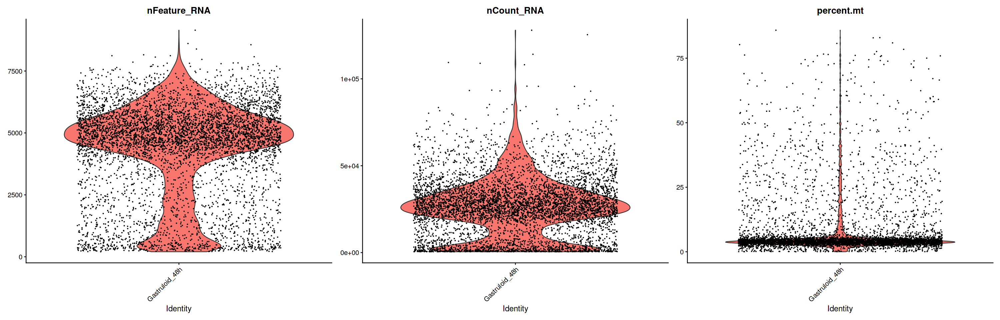

In [16]:
# QC, normalize and scale
library(repr)


Gastruloid_48h[["percent.mt"]] <- PercentageFeatureSet(Gastruloid_48h, pattern = "^mt-")

options(repr.plot.width=25, repr.plot.height=8)
VlnPlot(Gastruloid_48h, features = c("nFeature_RNA", "nCount_RNA", "percent.mt"), ncol = 3)

Warning message:
“Removed 1 rows containing missing values (geom_hline).”
Warning message:
“Removed 1 rows containing missing values (geom_hline).”


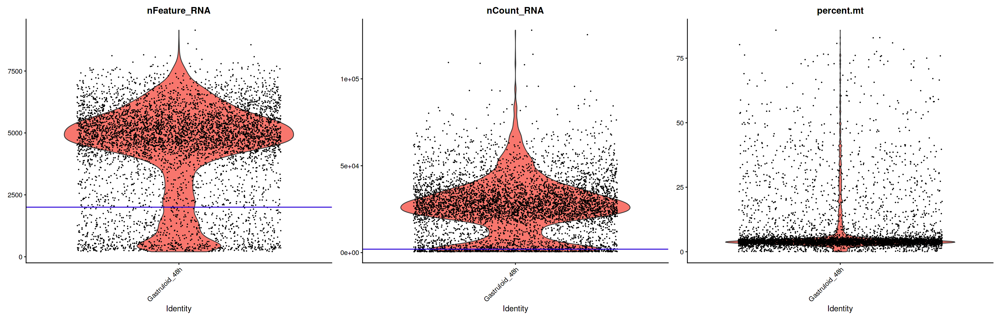

In [17]:
VlnPlot(Gastruloid_48h, features = c("nFeature_RNA", "nCount_RNA", "percent.mt"), ncol = 3) & geom_hline(yintercept = 2000, color="red") & geom_hline(yintercept = 2000, color="blue")

### Before QC (individual samples)

The default behaviour of split.by has changed.
Separate violin plots are now plotted side-by-side.
To restore the old behaviour of a single split violin,
set split.plot = TRUE.
      
This message will be shown once per session.



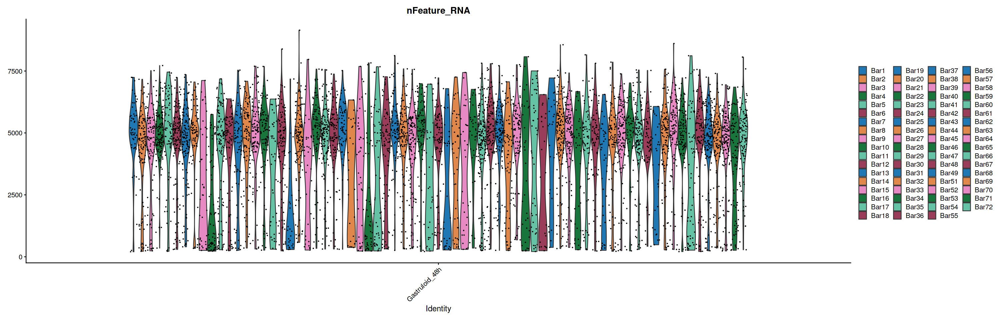

In [18]:
# Change plot size to 8 x 3
options(repr.plot.width=25, repr.plot.height=8)
VlnPlot(Gastruloid_48h, features = c("nFeature_RNA"),
        split.by = "Sample.barcode", cols = c('#1f78b4', '#e78ac3', '#66c2a5'))

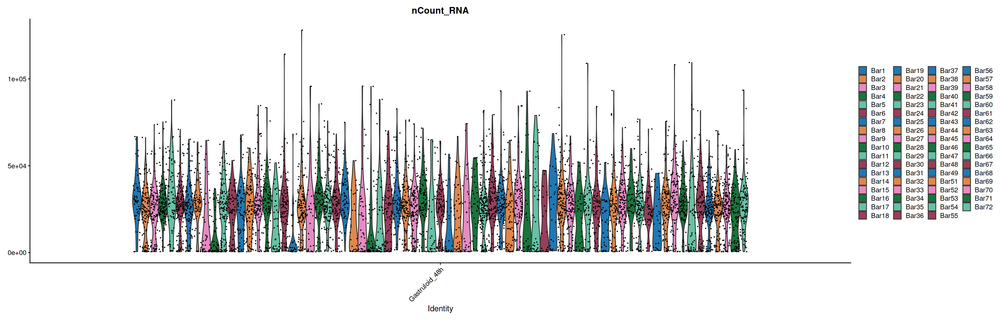

In [19]:
# Change plot size to 8 x 3
options(repr.plot.width=25, repr.plot.height=8)
VlnPlot(Gastruloid_48h, features = c("nCount_RNA"),
        split.by = "Sample.barcode", cols = c('#1f78b4', '#e78ac3', '#66c2a5'))

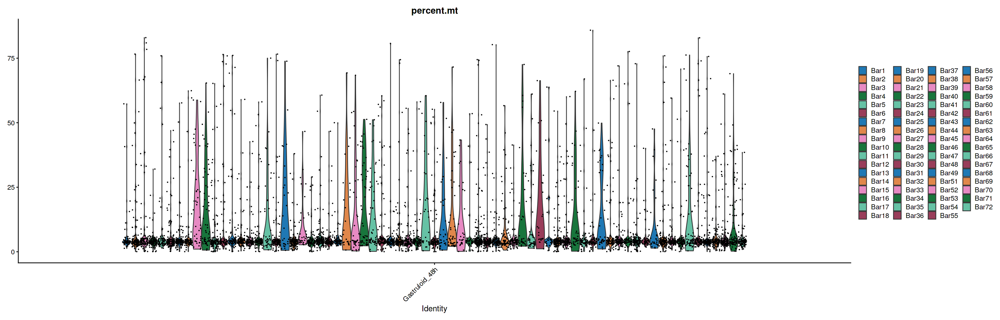

In [20]:
# Change plot size to 8 x 3
options(repr.plot.width=25, repr.plot.height=8)
VlnPlot(Gastruloid_48h, features = c("percent.mt"),
        split.by = "Sample.barcode", cols = c('#1f78b4', '#e78ac3', '#66c2a5'))

In [21]:
library(ggplot2)
# theme
source("https://gist.githubusercontent.com/benmarwick/2a1bb0133ff568cbe28d/raw/fb53bd97121f7f9ce947837ef1a4c65a73bffb3f/geom_flat_violin.R")
theme_niwot <- function(){
  theme_bw() +
    theme(text = element_text(family = "Helvetica Light"),
          axis.text = element_text(size = 16),
          axis.title = element_text(size = 18),
          axis.line.x = element_line(color="black"),
          axis.line.y = element_line(color="black"),
          panel.border = element_blank(),
          panel.grid.major.x = element_blank(),
          panel.grid.minor.x = element_blank(),
          panel.grid.minor.y = element_blank(),
          panel.grid.major.y = element_blank(),
          plot.margin = unit(c(1, 1, 1, 1), units = , "cm"),
          plot.title = element_text(size = 18, vjust = 1, hjust = 0),
          legend.text = element_text(size = 12),
          legend.title = element_blank(),
          legend.position = "right",
          legend.key = element_blank(),
          legend.background = element_rect(color = "black",
                                           fill = "transparent",
                                           size = 2, linetype = "blank"))}


Attaching package: ‘dplyr’


The following objects are masked from ‘package:stats’:

    filter, lag


The following objects are masked from ‘package:base’:

    intersect, setdiff, setequal, union




In [22]:
colours <- rep(c('#e41a1c',
'#377eb8',
'#4daf4a',
'#984ea3',
'#ff7f00'), 100)
length(colours)
 # n = number of colors seeked

[1] 500

In [23]:
cellnumber_beforeQC <- c(data.frame(table(metadata_48h$Sample.barcode))$Freq)
#cellnumber_beforeQC

labels_beforeQC <- paste(c(data.frame(table(metadata_48h$Sample.barcode))$Var1), c(data.frame(table(metadata_48h$Sample.barcode))$Freq), sep="-")
#metadata_48h

dim(metadata_48h)

[1] 5767    5

### Before QC (individual samples) > ggplot

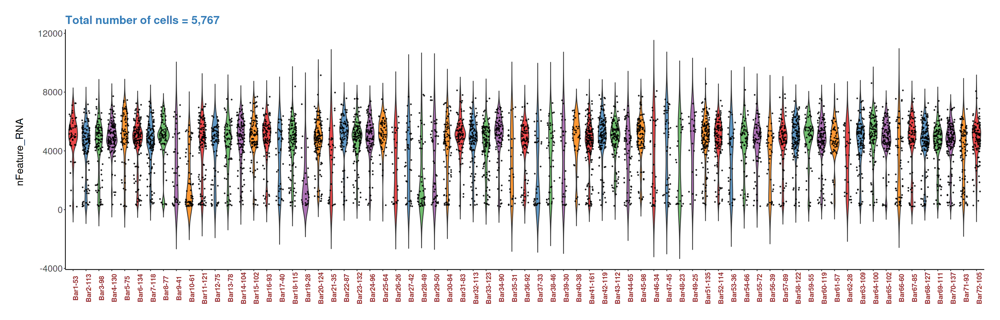

In [25]:
ggplot(data = metadata_48h, 
       aes(x = Sample.barcode, y = (nFeature_RNA), fill= Sample.barcode)) +
  # The half violins
  geom_violin(position = position_nudge(x = 0, y = 0), alpha = 0.8, trim=FALSE) +
  # The points
  geom_point(aes(y = (nFeature_RNA)),
             position = position_jitter(width = 0.3), size = 0.4, alpha = 0.8) +
  # The boxplots
  # geom_boxplot(width = 0.2, outlier.shape = NA, alpha = 0.6) +
  # \n adds a new line which creates some space between the axis and axis title
  labs(y = "nFeature_RNA  \n", x = NULL) +
  # Removing legends
  guides(fill = FALSE, color = FALSE) +
  # Setting the limits of the y axis
  #scale_y_continuous(limits = c(25, 40)) +
  # Picking nicer colours
  scale_fill_manual(values = colours) +
  scale_x_discrete(labels=as.character(labels_beforeQC)) +
  theme_niwot() +
  #geom_hline(yintercept=2000, linetype="dashed", color = "red") +
  ggtitle("Total number of cells = 5,767") +
  theme(axis.text.x = element_text(face="bold", color="#993333", 
                           size=12, angle=90),
       plot.title = element_text(color="#377eb8", size=20, face="bold"))

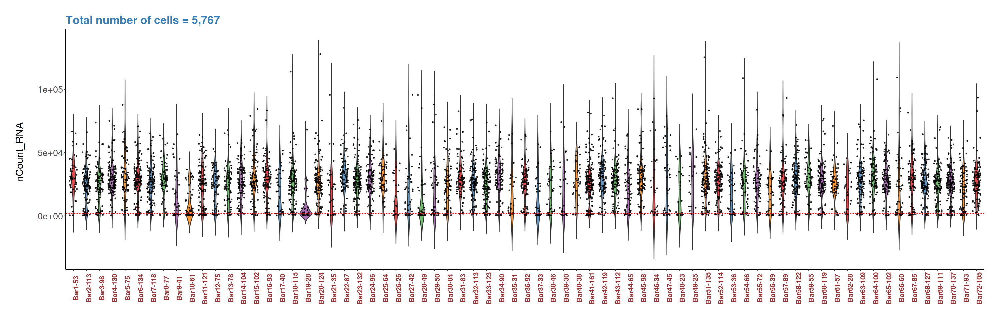

In [26]:
ggplot(data = metadata_48h, 
       aes(x = Sample.barcode, y = (nCount_RNA), fill= Sample.barcode)) +
  # The half violins
  geom_violin(position = position_nudge(x = 0, y = 0), alpha = 0.8, trim=FALSE) +
  # The points
  geom_point(aes(y = (nCount_RNA)),
             position = position_jitter(width = 0.3), size = 0.4, alpha = 0.8) +
  # The boxplots
  # geom_boxplot(width = 0.2, outlier.shape = NA, alpha = 0.6) +
  # \n adds a new line which creates some space between the axis and axis title
  labs(y = "nCount_RNA  \n", x = NULL) +
  # Removing legends
  guides(fill = FALSE, color = FALSE) +
  # Setting the limits of the y axis
  #scale_y_continuous(limits = c(25, 40)) +
  # Picking nicer colours
  scale_fill_manual(values = colours) +
  scale_x_discrete(labels=as.character(labels_beforeQC)) +
  theme_niwot() +
  geom_hline(yintercept=2000, linetype="dashed", color = "red") +
  ggtitle("Total number of cells = 5,767") +
  theme(axis.text.x = element_text(face="bold", color="#993333", 
                           size=12, angle=90),
       plot.title = element_text(color="#377eb8", size=20, face="bold"))

### After QC (all samples together)

[1] 19987  4061

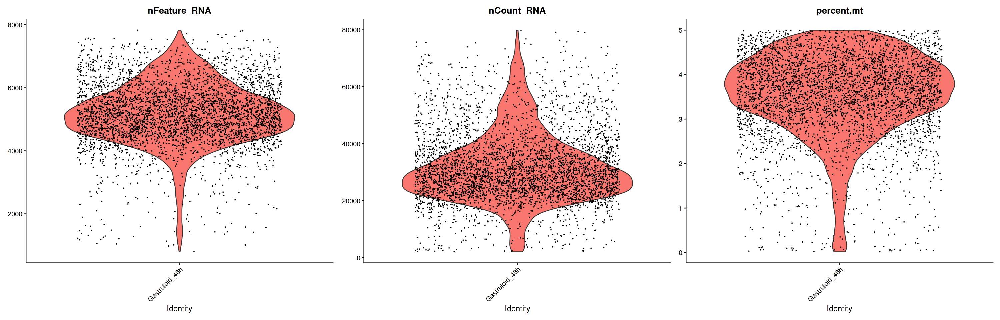

In [27]:
Gastruloid_48h_afterQC <- subset(Gastruloid_48h, subset = nCount_RNA > 2000 & nCount_RNA < 80000 & percent.mt < 5)
dim(Gastruloid_48h_afterQC)

VlnPlot(Gastruloid_48h_afterQC, features = c("nFeature_RNA", "nCount_RNA", "percent.mt"), ncol = 3)

### After QC (individual samples)

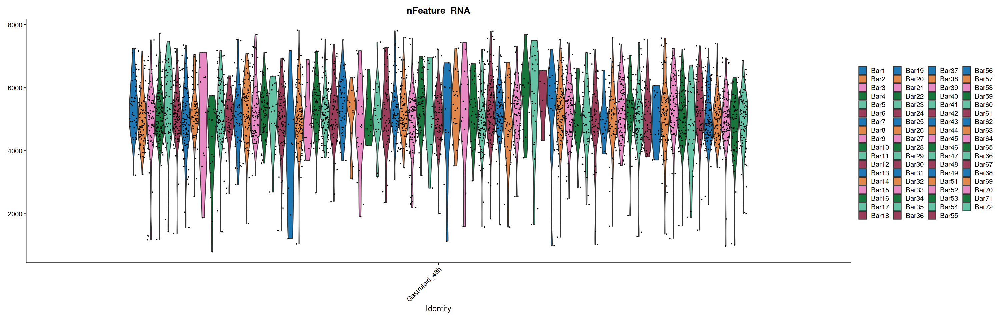

In [28]:
VlnPlot(Gastruloid_48h_afterQC, features = c("nFeature_RNA"),
        split.by = "Sample.barcode", cols = c('#1f78b4', '#e78ac3', '#66c2a5'))

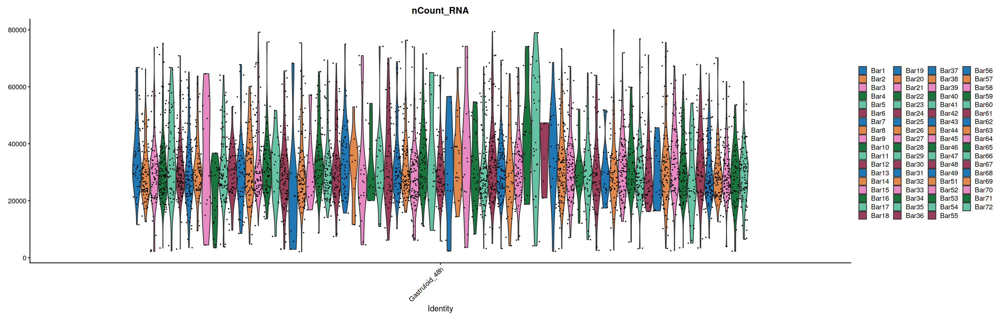

In [29]:
VlnPlot(Gastruloid_48h_afterQC, features = c("nCount_RNA"),
        split.by = "Sample.barcode", cols = c('#1f78b4', '#e78ac3', '#66c2a5'))

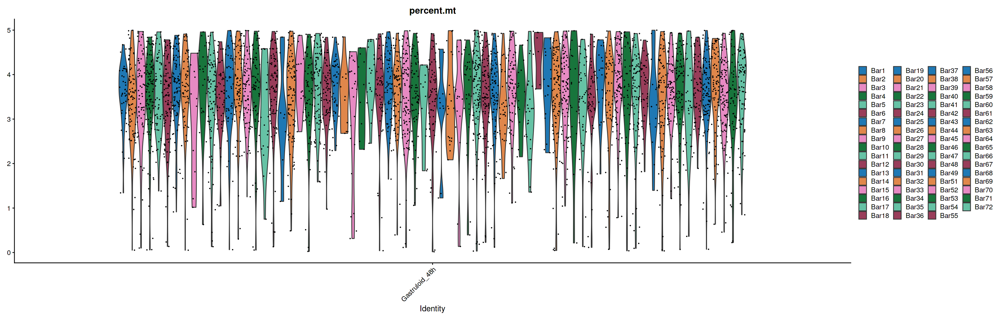

In [30]:
VlnPlot(Gastruloid_48h_afterQC, features = c("percent.mt"),
        split.by = "Sample.barcode", cols = c('#1f78b4', '#e78ac3', '#66c2a5'))

In [31]:
metadata_48h_afterQC <- Gastruloid_48h_afterQC@meta.data
head(metadata_48h_afterQC)
colnames(metadata_48h_afterQC)
dim(metadata_48h_afterQC)

,orig.ident,nCount_RNA,nFeature_RNA,Sample.barcode,Morphotype,percent.mt
,<fct>,<dbl>,<int>,<fct>,<chr>,<dbl>
AAACCCAAGTTCTACG-1,Gastruloid_48h,64623,6803,Bar44,round,2.092134
AAACCCACACAAGGTG-1,Gastruloid_48h,25851,4795,Bar68,round,2.471858
AAACGAACACTATCGA-1,Gastruloid_48h,74168,7685,Bar46,round,4.663736
AAACGAAGTCTCTCCA-1,Gastruloid_48h,30247,5505,Bar7,round,4.175621
AAACGAATCCAAAGGG-1,Gastruloid_48h,28538,4938,Bar2,round,3.444530
AAACGCTAGAACAAGG-1,Gastruloid_48h,27113,5327,Bar64,round,3.714085


[1] "orig.ident"     "nCount_RNA"     "nFeature_RNA"   "Sample.barcode"
[5] "Morphotype"     "percent.mt"

[1] 4061    6

,Var1,Freq
,<fct>,<int>
1,Bar1,41
2,Bar2,82
3,Bar3,67
4,Bar4,110
5,Bar5,57
6,Bar6,103


[1] 63

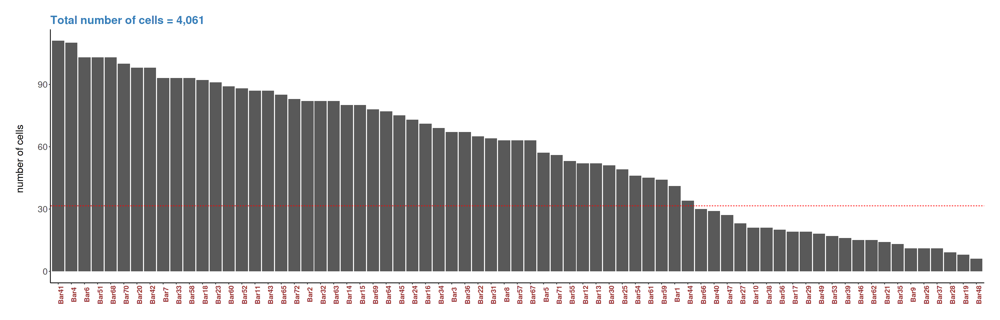

In [32]:
x <- data.frame(table(metadata_48h_afterQC$Sample.barcode))
head(x)
median(x$Freq)

# Barplot
ggplot(x, aes(x=reorder(Var1, -Freq), y=Freq)) + 
  geom_bar(stat = "identity")+
  # The boxplots
  # geom_boxplot(width = 0.2, outlier.shape = NA, alpha = 0.6) +
  # \n adds a new line which creates some space between the axis and axis title
  labs(y = "number of cells  \n", x = NULL) +
  # Removing legends
  guides(fill = FALSE, color = FALSE) +
  # Setting the limits of the y axis
  #scale_y_continuous(limits = c(25, 40)) +
  # Picking nicer colours
  scale_fill_manual(values = colours) +
  theme_niwot() +
  geom_hline(yintercept=median(x$Freq)/2, linetype="dashed", color = "red") +
  ggtitle("Total number of cells = 4,061") +
  theme(axis.text.x = element_text(face="bold", color="#993333", 
                           size=12, angle=90),
       plot.title = element_text(color="#377eb8", size=20, face="bold"))

In [33]:

# order sample barcode numerically
library(stringr)

myLevels <- c(data.frame(table(metadata_48h_afterQC$Sample.barcode))$Var1)
myLevels <- str_sort(myLevels, numeric = TRUE)
head(myLevels)

#factor(Gastruloid_48h@meta.data$Sample.barcode, levels= myLevels)
metadata_48h_afterQC$Sample.barcode <- factor(metadata_48h_afterQC$Sample.barcode, levels= myLevels)
levels(metadata_48h_afterQC$Sample.barcode)


[1] "Bar1" "Bar2" "Bar3" "Bar4" "Bar5" "Bar6"

[1] "Bar1"  "Bar2"  "Bar3"  "Bar4"  "Bar5"  "Bar6"  "Bar7"  "Bar8"  "Bar9" 
[10] "Bar10" "Bar11" "Bar12" "Bar13" "Bar14" "Bar15" "Bar16" "Bar17" "Bar18"
[19] "Bar19" "Bar20" "Bar21" "Bar22" "Bar23" "Bar24" "Bar25" "Bar26" "Bar27"
[28] "Bar28" "Bar29" "Bar30" "Bar31" "Bar32" "Bar33" "Bar34" "Bar35" "Bar36"
[37] "Bar37" "Bar38" "Bar39" "Bar40" "Bar41" "Bar42" "Bar43" "Bar44" "Bar45"
[46] "Bar46" "Bar47" "Bar48" "Bar49" "Bar51" "Bar52" "Bar53" "Bar54" "Bar55"
[55] "Bar56" "Bar57" "Bar58" "Bar59" "Bar60" "Bar61" "Bar62" "Bar63" "Bar64"
[64] "Bar65" "Bar66" "Bar67" "Bar68" "Bar69" "Bar70" "Bar71" "Bar72"

In [36]:
myLevels <- c(data.frame(table(Gastruloid_48h_afterQC@meta.data$Sample.barcode))$Var1)
myLevels <- str_sort(myLevels, numeric = TRUE)
head(myLevels)

#factor(Gastruloid_48h@meta.data$Sample.barcode, levels= myLevels)
Gastruloid_48h_afterQC@meta.data$Sample.barcode <- factor(Gastruloid_48h_afterQC@meta.data$Sample.barcode, levels= myLevels)

[1] "Bar1" "Bar2" "Bar3" "Bar4" "Bar5" "Bar6"

In [37]:
levels(Gastruloid_48h_afterQC@meta.data$Sample.barcode)

[1] "Bar1"  "Bar2"  "Bar3"  "Bar4"  "Bar5"  "Bar6"  "Bar7"  "Bar8"  "Bar9" 
[10] "Bar10" "Bar11" "Bar12" "Bar13" "Bar14" "Bar15" "Bar16" "Bar17" "Bar18"
[19] "Bar19" "Bar20" "Bar21" "Bar22" "Bar23" "Bar24" "Bar25" "Bar26" "Bar27"
[28] "Bar28" "Bar29" "Bar30" "Bar31" "Bar32" "Bar33" "Bar34" "Bar35" "Bar36"
[37] "Bar37" "Bar38" "Bar39" "Bar40" "Bar41" "Bar42" "Bar43" "Bar44" "Bar45"
[46] "Bar46" "Bar47" "Bar48" "Bar49" "Bar51" "Bar52" "Bar53" "Bar54" "Bar55"
[55] "Bar56" "Bar57" "Bar58" "Bar59" "Bar60" "Bar61" "Bar62" "Bar63" "Bar64"
[64] "Bar65" "Bar66" "Bar67" "Bar68" "Bar69" "Bar70" "Bar71" "Bar72"

In [38]:
cellnumber_afterQC <- c(data.frame(table(metadata_48h_afterQC$Sample.barcode))$Freq)
#cellnumber_afterQC

labels_afterQC <- paste(c(data.frame(table(metadata_48h_afterQC$Sample.barcode))$Var1), c(data.frame(table(metadata_48h_afterQC$Sample.barcode))$Freq), sep="-")
#labels_afterQC

### After QC (individual samples) > ggplot

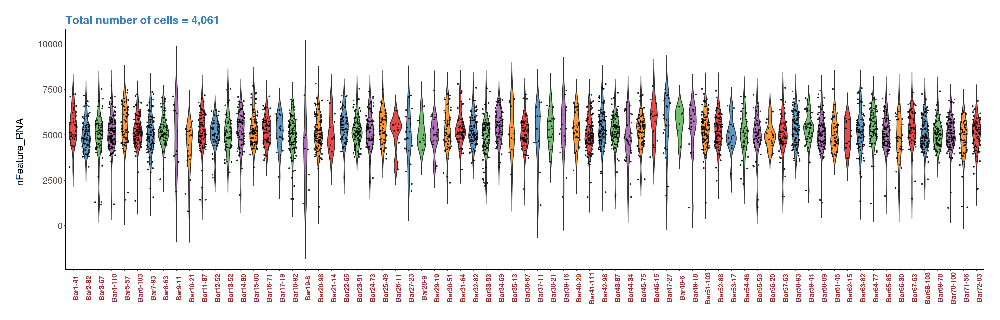

In [39]:
ggplot(data = metadata_48h_afterQC, 
       aes(x = Sample.barcode, y = (nFeature_RNA), fill= Sample.barcode)) +
  # The half violins
  geom_violin(position = position_nudge(x = 0, y = 0), alpha = 0.8, trim=FALSE) +
  # The points
  geom_point(aes(y = (nFeature_RNA)),
             position = position_jitter(width = 0.3), size = 0.4, alpha = 0.8) +
  # The boxplots
  # geom_boxplot(width = 0.2, outlier.shape = NA, alpha = 0.6) +
  # \n adds a new line which creates some space between the axis and axis title
  labs(y = "nFeature_RNA  \n", x = NULL) +
  # Removing legends
  guides(fill = FALSE, color = FALSE) +
  # Setting the limits of the y axis
  #scale_y_continuous(limits = c(25, 40)) +
  # Picking nicer colours
  scale_fill_manual(values = colours) +
  scale_x_discrete(labels=as.character(labels_afterQC)) +
  theme_niwot() +
  ggtitle("Total number of cells = 4,061") +
  theme(axis.text.x = element_text(face="bold", color="#993333", 
                           size=12, angle=90),
       plot.title = element_text(color="#377eb8", size=20, face="bold"))



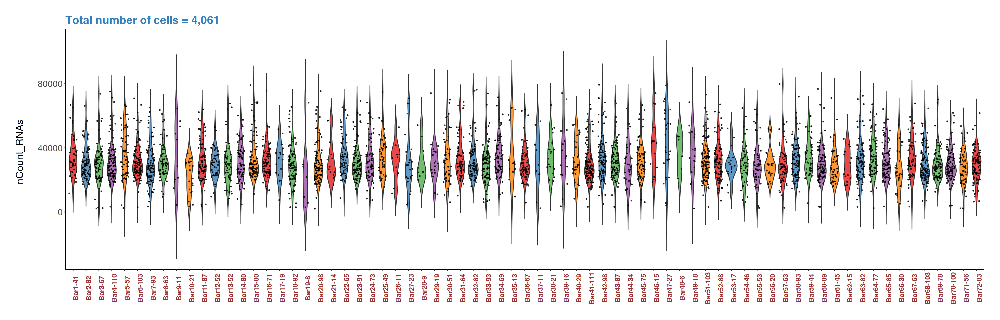

In [40]:
ggplot(data = metadata_48h_afterQC, 
       aes(x = Sample.barcode, y = (nCount_RNA), fill = Sample.barcode)) +
  # The half violins
  geom_violin(position = position_nudge(x = 0, y = 0), alpha = 0.8, trim=FALSE) +
  # The points
  geom_point(aes(y = (nCount_RNA)),
             position = position_jitter(width = 0.3), size = 0.4, alpha = 0.8) +
  # The boxplots
  # geom_boxplot(width = 0.2, outlier.shape = NA, alpha = 0.6) +
  # \n adds a new line which creates some space between the axis and axis title
  labs(y = "nCount_RNAs  \n", x = NULL) +
  # Removing legends
  guides(fill = FALSE, color = FALSE) +
  # Setting the limits of the y axis
  #scale_y_continuous(limits = c(25, 40)) +
  # Picking nicer colours
  scale_fill_manual(values = colours) +
  scale_x_discrete(labels=as.character(labels_afterQC)) +
  theme_niwot() +  
  ggtitle("Total number of cells = 4,061") +
  theme(axis.text.x = element_text(face="bold", color="#993333", 
                           size=12, angle=90),
       plot.title = element_text(color="#377eb8", size=20, face="bold"))






# Saving Seurat object & metadata info (after QC)

In [41]:
# Save the files
saveRDS(Gastruloid_48h_afterQC, file = "./files/Seurat_Obj_afterQC/Gastruloid_48h_afterQC.rds")
saveRDS(metadata_48h_afterQC, file = "./files/Seurat_Obj_afterQC/metadata_48h_afterQC.rds")